In [1]:
library(Seurat)
library(SeuratDisk)
library(dplyr)
library(ggplot2)
library(patchwork)

Warning message in fun(libname, pkgname):
“rgeos: versions of GEOS runtime 3.11.0-CAPI-1.17.0
and GEOS at installation 3.10.2-CAPI-1.16.0differ”
Attaching SeuratObject

Attaching sp

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
#setwd("~/prj/catatac/scripts")

# Load guide-capture data

Define paths etc

In [3]:
# Pass these as parameters
# h5_name = "/home/vsevim/prj/tf/CATATAC_4/analysis/secondary/CRISPR8/seurat/CATATAC_4_CRISPR8_ONLY_SINGLETS.h5seurat"
# protosp_path = "/home/vsevim/prj/tf/CATATAC_4/analysis/primary/CRISPR8/resources/protospacers_4set.tsv"
# library = "CRISPR8"
# tsv_path = "/home/vsevim/prj/tf/CATATAC_4/analysis/primary/CRISPR8/tsv"


In [4]:
h5_w_gcap_name <- sub(".h5seurat", "_w_GUIDE_CAP.h5seurat", h5_name)
barcode2guide_tsv_path <- paste0(tsv_path, "/", library, "_ALL_STRUCTURED.TSV")
tsv_name <- paste0(tsv_path, "/", library, "_PIVOT.TSV")

### Load protospacer file

In [5]:
df_protosp = read.table(protosp_path, header=TRUE, comment.char="")

In [6]:
tfs_w_ntctl    = unique(df_protosp$X.TargetGene)
unselect_ntctl = (tfs_w_ntctl != "NTCTL") & (tfs_w_ntctl != "NTCTRL")
tfs_to_plot    = tfs_w_ntctl[unselect_ntctl]

guides_to_plot  = df_protosp$GuideName
tfs_to_plot
guides_to_plot

[1] "GATA5"   "MEOX1"   "NEUROG2"

[1] "GATA5_1"   "GATA5_2"   "MEOX1_1"   "MEOX1_2"   "NEUROG2_1" "NEUROG2_2"
[7] "NTCTL_1"   "NTCTL_2"

In [7]:
df_protosp

X.TargetGene,GuideName,Protospacer
<chr>,<chr>,<chr>
GATA5,GATA5_1,GCTGACCCTGCGGGGAAGAA
GATA5,GATA5_2,GTCGCCAAGCCCCGCGAGCA
MEOX1,MEOX1_1,GCATCAAATGCCAAATTCCA
MEOX1,MEOX1_2,GCTGAAGTGAAATGTGAGAG
NEUROG2,NEUROG2_1,GGGAGCTGGCGAAGCCGCAG
NEUROG2,NEUROG2_2,GGGAAAGGCGGTGAAGAAAG
NTCTL,NTCTL_1,GTGTCGTGATGCGTAGACGG
NTCTL,NTCTL_2,GTCATCAAGGAGCATTCCGT


In [8]:
#c("OTP", "MYF6", "MEIS1", "FLI1", "HHEX", "HOXA6", "ELF5", "GBX1", "DPRX", "NTCTL")
tf_list   <- tfs_w_ntctl
df_guide      <- read.table(tsv_name, header = TRUE, sep = "\t", quote = "")
guide_counts  <- t(data.matrix(df_guide[,tf_list]))
colnames(guide_counts) <- df_guide$barcode_dash
guide_counts

,AAACAGCCAAACTGCC-1,AAACAGCCAAAGCCTC-1,AAACAGCCAAATGCCC-1,AAACAGCCAACCGCCA-1,AAACAGCCAAGCGAGC-1,AAACAGCCAATAGCAA-1,AAACAGCCAATCGCAC-1,AAACAGCCAATTAAGG-1,AAACAGCCAATTATGC-1,AAACAGCCACACTAAT-1,⋯,TTTGTTGGTTGCATCT-1,TTTGTTGGTTGTAACG-1,TTTGTTGGTTGTTGTC-1,TTTGTTGGTTTAAAGC-1,TTTGTTGGTTTAGTCC-1,TTTGTTGGTTTATTCG-1,TTTGTTGGTTTCAGGA-1,TTTGTTGGTTTCCACG-1,TTTGTTGGTTTGGGCG-1,TTTGTTGGTTTGGTTC-1
GATA5,11,107,42,22,15,15,4,0,72,10,⋯,37,4,0,34,7,32,19,0,26,9
MEOX1,25,34,102,82,43,32,13,39,70,43,⋯,86,111,9,17,48,103,93,35,0,0
NEUROG2,6,29,13,84,59,34,1,21,20,40,⋯,57,28,0,3,21,31,85,16,0,0
NTCTL,8,23,9,31,4,17,11,24,13,9,⋯,4,19,0,5,8,25,27,0,0,0


In [9]:
sum(guide_counts['NTCTL',])

[1] 2636195

Get overlapping cells

In [10]:
N_MIN_GUIDES <- 2
select_overlapping   <-
    df_guide$in_multiome & (df_guide$n_guides >= N_MIN_GUIDES)

overlapping_barcodes <- df_guide[select_overlapping, ]$barcode_dash
overlapping_barcodes <- as.vector(overlapping_barcodes)

overlapping_guide_counts <- guide_counts[, overlapping_barcodes]

n_all_overlapping <- nrow(df_guide[df_guide$in_multiome, ])
paste("Overlapping barcodes w/ min guides =", N_MIN_GUIDES,": ", length(overlapping_barcodes))
paste("Overlapping barcodes w/ min guides =", 1,": ", n_all_overlapping)


[1] "Overlapping barcodes w/ min guides = 2 :  15106"

[1] "Overlapping barcodes w/ min guides = 1 :  15107"

In [11]:
head(overlapping_guide_counts)

,AAACAGCCAAAGCCTC-1,AAACAGCCAATTATGC-1,AAACAGCCACAGAACG-1,AAACAGCCACATTGCA-1,AAACAGCCACCAAAGG-1,AAACAGCCAGGTTATT-1,AAACAGCCAGTATGTT-1,AAACAGCCAGTTATCG-1,AAACAGCCATAATCCG-1,AAACAGCCATGTGGGA-1,⋯,TTTGTGTTCATTTGCT-1,TTTGTGTTCTTGCTAT-1,TTTGTTGGTATTGCAG-1,TTTGTTGGTCAGGCCA-1,TTTGTTGGTCAGTAAT-1,TTTGTTGGTGCGCGTA-1,TTTGTTGGTGTAATAC-1,TTTGTTGGTTAGTACG-1,TTTGTTGGTTCCTGAT-1,TTTGTTGGTTGAGCCG-1
GATA5,107,72,43,57,1266,230,1409,0,10,11,⋯,421,63,18,683,20,145,11,13,103,22
MEOX1,34,70,50,75,20,104,81,73,97,746,⋯,57,130,596,84,63,68,77,158,292,107
NEUROG2,29,20,48,82,12,84,45,45,874,108,⋯,65,95,59,39,92,43,66,467,26,70
NTCTL,23,13,17,171,17,22,10,34,28,1,⋯,25,65,41,6,45,39,207,59,2,380


Load multiome seurat object

In [12]:
if (!exists("seurat_all")) {
    seurat_all <- LoadH5Seurat(h5_name)
}

Validating h5Seurat file

Initializing ATAC with data

Adding counts for ATAC

Adding feature-level metadata for ATAC

Adding variable feature information for ATAC

Adding miscellaneous information for ATAC

Loading required package: Signac

Initializing RNA with data

Adding counts for RNA

Adding miscellaneous information for RNA

Initializing SCT with data

Adding counts for SCT

Adding scale.data for SCT

Adding variable feature information for SCT

Adding miscellaneous information for SCT

Adding reduction lsi

Adding cell embeddings for lsi

Adding feature loadings for lsi

Adding miscellaneous information for lsi

Adding reduction umap.atac

Adding cell embeddings for umap.atac

Adding miscellaneous information for umap.atac

Adding reduction wnn.umap

Adding cell embeddings for wnn.umap

Adding miscellaneous information for wnn.umap

Adding reduction pca

Adding cell embeddings for pca

Adding feature loadings for pca

Adding miscellaneous information for pca

Adding reduction 

In [13]:
# Select cells found in guide capture
seurat     <- subset(seurat_all, cells = overlapping_barcodes)
n_multiome <- length(Cells(seurat_all))

In [14]:
# Add guide data as a new assay independent from RNA & ATAC
seurat[["guidecapture"]] <- CreateAssayObject(counts = overlapping_guide_counts)
head(seurat$guidecapture@counts)

   [[ suppressing 15106 column names ‘AAACAGCCAAAGCCTC-1’, ‘AAACAGCCAATTATGC-1’, ‘AAACAGCCACAGAACG-1’ ... ]]



4 x 15106 sparse Matrix of class "dgCMatrix"
                                                                               
GATA5   107 72 43  57 1266 230 1409  .  10  11  43  194    7 10  12  21  46  34
MEOX1    34 70 50  75   20 104   81 73  97 746 107  121   24 42 140  96 179  87
NEUROG2  29 20 48  82   12  84   45 45 874 108  29 2138 2327 62  85  65  67  59
NTCTL    23 13 17 171   17  22   10 34  28   1  64   24    6 25  54 194 215 117
                                                                              
GATA5   881 173 19 35  42  43   65  24  34   13 158   19  67 110  659 382   37
MEOX1    65  50 61 64 104 193   31  59 123 2451 114 1171  47  64  141  85 1626
NEUROG2  29  49 38 52 467 120 1241 122  35   59  52   63 933  87 1189  29   20
NTCTL     1   1 36 69  56 683   34  42   7   24   1   27   6  39    7  30   11
                                                                               
GATA5    45 11   37 88  53  40 196 321   46   84   8  21   69   21  51   6   43


In [14]:
# x <- GetAssayData(seurat, "counts")
# cells <- colnames(x[ , colSums(x) != 0])
# feats <- names((rowSums(x) != 0) == TRUE)
# seurat <- seurat[feats, cells] 

In [15]:
# Normalize guide data, here we use centered log-ratio (CLR) transformation
seurat <- NormalizeData(seurat, assay = "guidecapture", normalization.method = "CLR")

Normalizing across features



In [16]:
seurat <- HTODemux(seurat, assay = "guidecapture", positive.quantile = 0.99)

Cutoff for GATA5 : 144 reads

Cutoff for MEOX1 : 364 reads

Cutoff for NEUROG2 : 221 reads

Cutoff for NTCTL : 119 reads



In [17]:
unique(seurat$guidecapture_secondID)

[1] "NTCTL"   "MEOX1"   "GATA5"   "NEUROG2"

In [19]:
str(seurat@assays$guidecapture)

Formal class 'Assay' [package "SeuratObject"] with 8 slots
  ..@ counts       :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. .. ..@ i       : int [1:59335] 0 1 2 3 0 1 2 3 0 1 ...
  .. .. ..@ p       : int [1:15107] 0 4 8 12 16 20 24 28 31 35 ...
  .. .. ..@ Dim     : int [1:2] 4 15106
  .. .. ..@ Dimnames:List of 2
  .. .. .. ..$ : chr [1:4] "GATA5" "MEOX1" "NEUROG2" "NTCTL"
  .. .. .. ..$ : chr [1:15106] "AAACAGCCAAAGCCTC-1" "AAACAGCCAATTATGC-1" "AAACAGCCACAGAACG-1" "AAACAGCCACATTGCA-1" ...
  .. .. ..@ x       : num [1:59335] 107 34 29 23 72 70 20 13 43 50 ...
  .. .. ..@ factors : list()
  ..@ data         : num [1:4, 1:15106] 1.278 0.236 0.285 0.563 1.009 ...
  .. ..- attr(*, "dimnames")=List of 2
  .. .. ..$ : chr [1:4] "GATA5" "MEOX1" "NEUROG2" "NTCTL"
  .. .. ..$ : chr [1:15106] "AAACAGCCAAAGCCTC-1" "AAACAGCCAATTATGC-1" "AAACAGCCACAGAACG-1" "AAACAGCCACATTGCA-1" ...
  ..@ scale.data   : num[0 , 0 ] 
  ..@ key          : chr "guidecapture_"
  ..@ assay.orig   : NUL

# Visualize

In [20]:
if (!exists("seurat")) {
    seurat <- LoadH5Seurat(h5_w_gcap_name)
}

In [21]:
# Global classification results
n_cells <- length(seurat$guidecapture_classification.global)
demux_counts      <- table(seurat$guidecapture_classification.global)
demux_percentages <- round(demux_counts/n_cells, 2)

demux_counts
demux_percentages

n_doublets <- demux_counts[["Doublet"]]
n_singlets <- demux_counts[["Singlet"]]

capture_efficiency_1 <- 100*(n_doublets + n_singlets) / n_multiome
paste("Capture efficiency% = ", round(capture_efficiency_1), "( norm by", n_multiome, ")")

#capture_efficiency_2 <- 100 * (n_doublets + n_singlets) / n_all_overlapping
#paste("Capture efficiency%", round(capture_efficiency_2), "( norm by", n_all_overlapping, ")")


 Doublet Negative  Singlet 
     484     5932     8690 


 Doublet Negative  Singlet 
    0.03     0.39     0.58 

[1] "Capture efficiency% =  61 ( norm by 15107 )"

In [22]:
length(Cells(seurat))

[1] 15106

In [23]:
# Group cells based on the max HTO signal
guide_names <- rownames(seurat[["guidecapture"]])
num_pcs     <- length(guide_names)

Picking joint bandwidth of 49.7

Picking joint bandwidth of 112

Picking joint bandwidth of 109

Picking joint bandwidth of 26.2

Picking joint bandwidth of 0.138

Picking joint bandwidth of 0.11

Picking joint bandwidth of 0.127

Picking joint bandwidth of 0.132



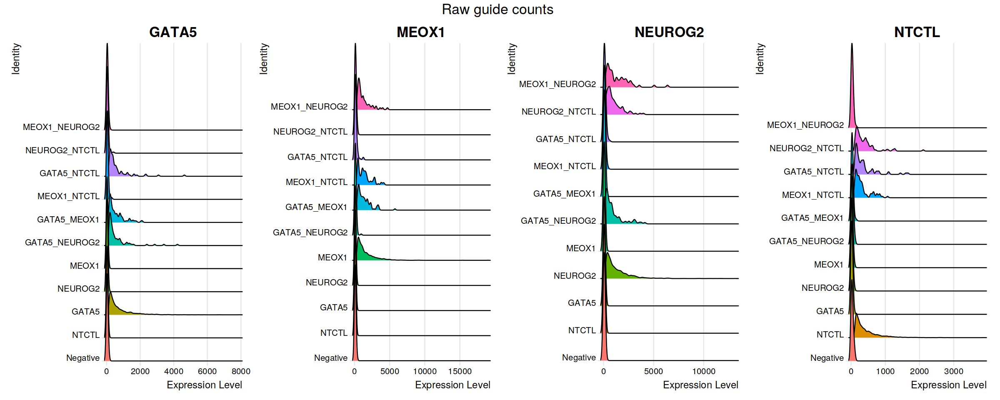

Picking joint bandwidth of 0.0547

Picking joint bandwidth of 0.0186

Picking joint bandwidth of 0.0626



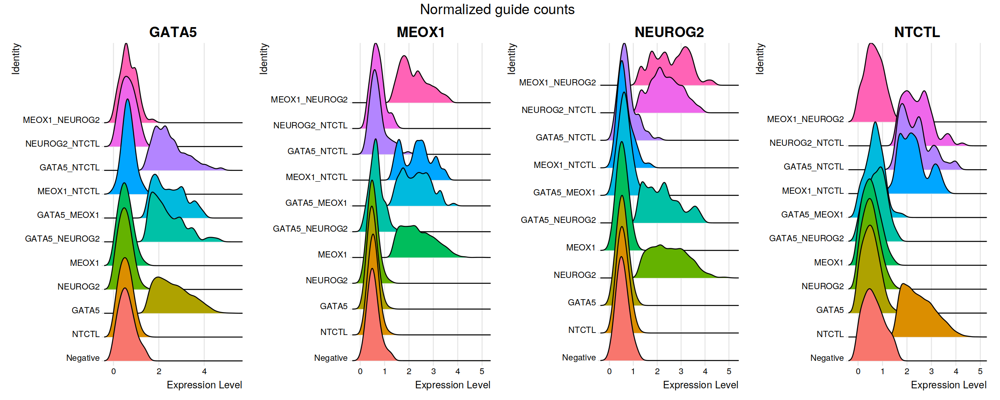

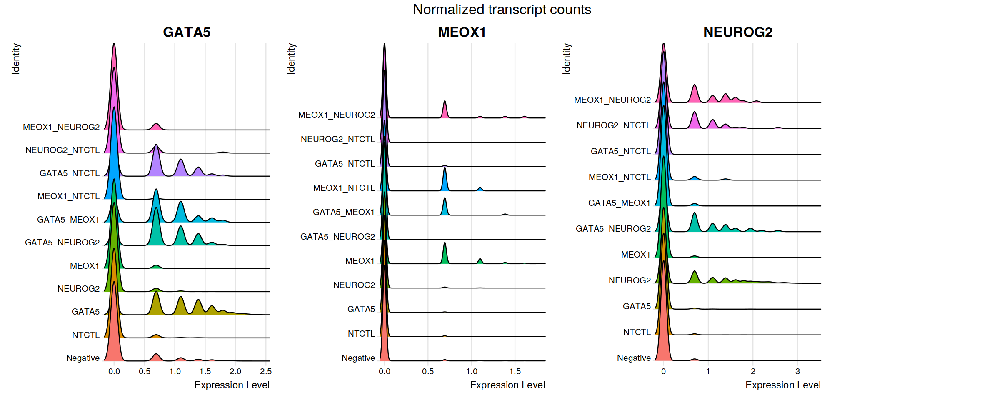

In [24]:
options(repr.plot.width = 20, repr.plot.height = 8)
tf_list <- tfs_to_plot

Idents(seurat) <- "guidecapture_classification"

RidgePlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    slot="counts",
    ncol = 4
) + plot_annotation(title = "Raw guide counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

RidgePlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    ncol = 4
) + plot_annotation(title = "Normalized guide counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

RidgePlot(
    seurat,
    assay = "SCT",
    features = tf_list,
    ncol = 4,
    y.max = .5
)+ plot_annotation(title = "Normalized transcript counts") & theme(plot.title = element_text(hjust = 0.5, size = 20))

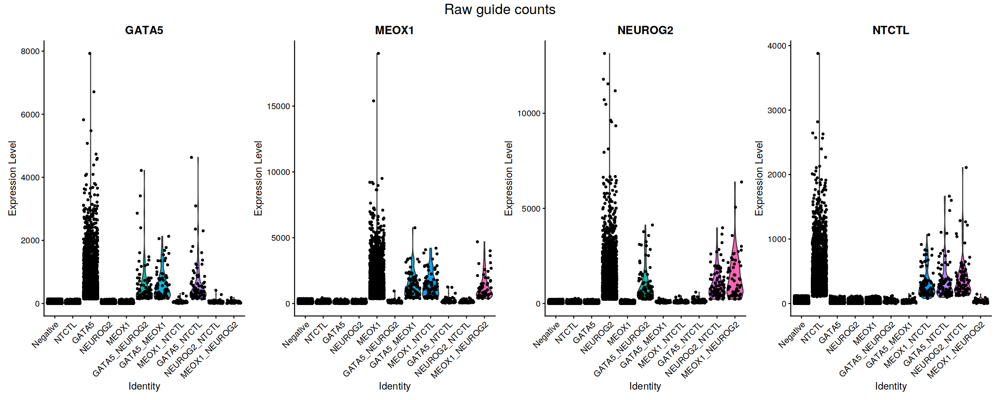

In [25]:
VlnPlot(
    seurat,
    assay = "guidecapture",
    features = guide_names,
    slot="counts",
    ncol = 4
) + plot_annotation(title = "Raw guide counts", 
                    theme = theme(plot.title = element_text(hjust = 0.5, size = 20)))


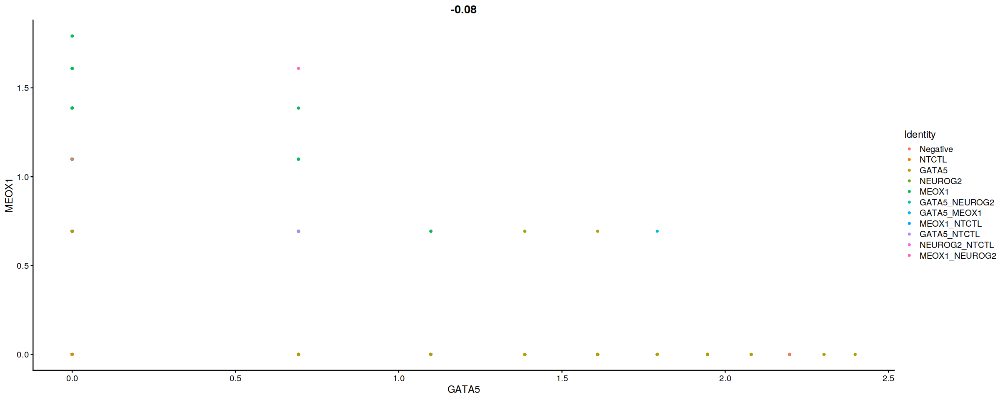

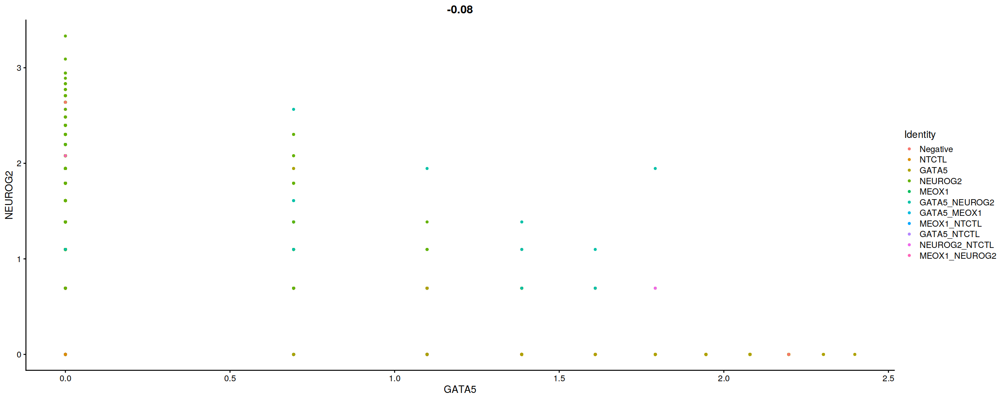

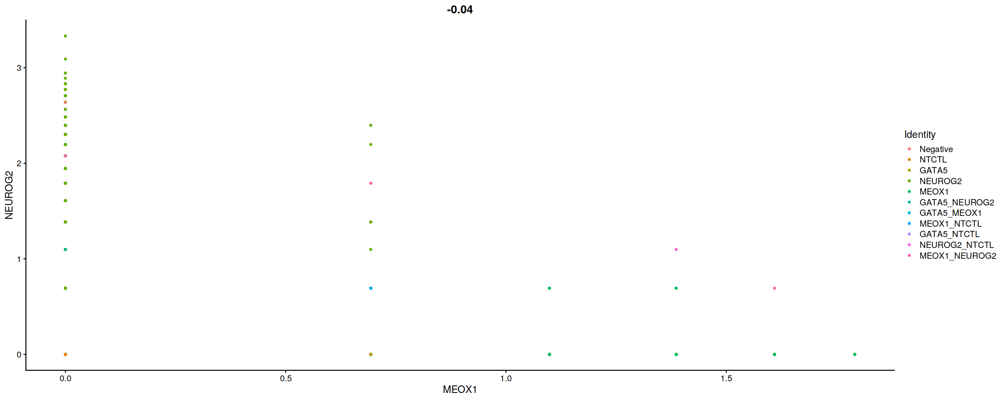

In [26]:
# FeatureScatter(seurat, feature1 = "GATA5", feature2 = "MEOX1")
# FeatureScatter(seurat, feature1 = "GATA5", feature2 = "NEUROG2")
# FeatureScatter(seurat, feature1 = "MEOX1", feature2 = "NEUROG2")

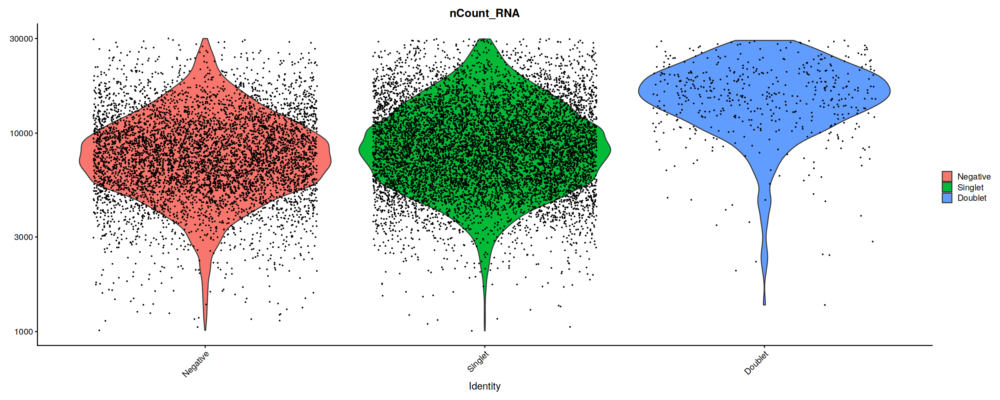

In [27]:
Idents(seurat) <- "guidecapture_classification.global"
VlnPlot(seurat, features = "nCount_RNA", pt.size = 0.1, log = TRUE)

In [28]:
# First, we will remove negative cells from the object
seurat_subset <- subset(seurat, idents = "Negative", invert = TRUE)

# Calculate a tSNE embedding of the HTO data
DefaultAssay(seurat_subset) <- "guidecapture"

In [29]:

seurat_subset <-
    ScaleData(seurat_subset, features = guide_names, verbose = FALSE)

# seurat_subset <- RunPCA(
#     seurat_subset,
#     npcs = num_pcs,
#     ndims.print = 1:num_pcs,
#     features = guide_names,
#     approx = FALSE
# )

# seurat_subset <-
#     RunTSNE(
#         seurat_subset,
#         dims = 1:num_pcs,
#         perplexity = 100,
#         check_duplicates = FALSE
#     )

# seurat_subset <-
#     RunUMAP(seurat_subset, dims = 1:num_pcs)

#DimPlot(seurat_subset, reduction = "tsne")

Warning message:
“`guides(<scale> = FALSE)` is deprecated. Please use `guides(<scale> = "none")` instead.”


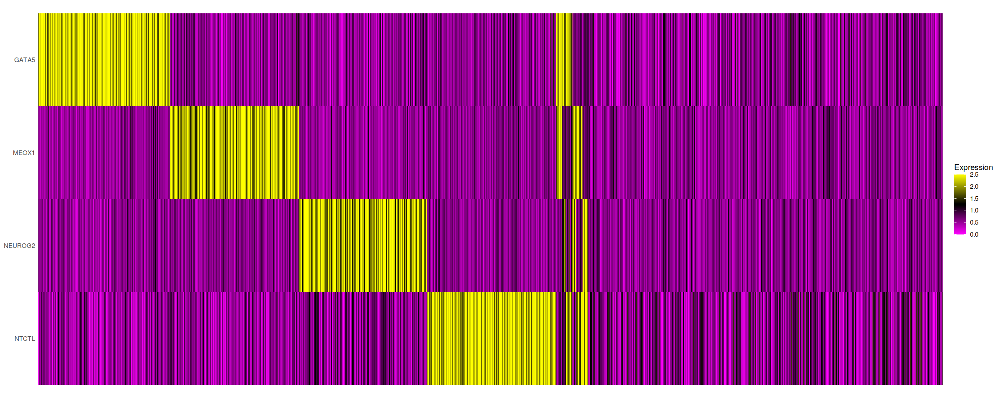

In [30]:
HTOHeatmap(seurat, assay = "guidecapture")

In [31]:
SaveH5Seurat(seurat, h5_w_gcap_name, overwrite = TRUE)

Warning message:
“Overwriting previous file /home/vsevim/prj/tf/CATATAC_4/analysis/secondary/CRISPR8/seurat/CATATAC_4_CRISPR8_ONLY_SINGLETS_w_GUIDE_CAP.h5seurat”
Creating h5Seurat file for version 3.1.5.9900

Adding counts for SCT

Adding data for SCT

Adding scale.data for SCT

Adding variable features for SCT

No feature-level metadata found for SCT

Writing out SCTModel.list for SCT

Adding counts for ATAC

Adding data for ATAC

Adding variable features for ATAC

Adding feature-level metadata for ATAC

Writing out ranges for ATAC

Writing out motifs for ATAC

Writing out fragments for ATAC

Writing out seqinfo for ATAC

Writing out annotation for ATAC

Writing out bias for ATAC

Writing out positionEnrichment for ATAC

Writing out links for ATAC

Adding counts for RNA

Adding data for RNA

No variable features found for RNA

No feature-level metadata found for RNA

Adding counts for guidecapture

Adding data for guidecapture

No variable features found for guidecapture

No feature-l

# Inspect results

In [32]:
seurat_negatives <- subset(seurat, idents = "Negative")
seurat_singlets  <- subset(seurat, idents = "Singlet")
seurat_doublets  <- subset(seurat, idents = "Doublet")

Idents(seurat_singlets) <- seurat_singlets@meta.data$guidecapture_classification
Idents(seurat_doublets) <- seurat_doublets@meta.data$guidecapture_classification

### Singlets

In [33]:
singlet_barcodes <- Cells(seurat_singlets)
select_singlets  <- df_guide$barcode_dash %in% singlet_barcodes
df_singlets      <- df_guide[select_singlets, ]

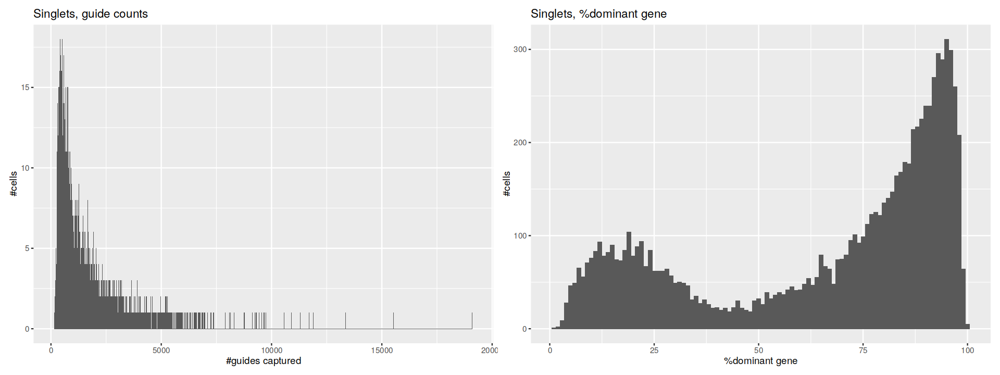

In [34]:
options(repr.plot.width = 16, repr.plot.height = 6)

plot_n_guides <- ggplot(df_singlets, aes(x = n_guides)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Singlets, guide counts", x = "#guides captured") +
    labs(y = "#cells")

plot_dominant <- ggplot(df_singlets, aes(x = percent_dominant_gene)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Singlets, %dominant gene", x = "%dominant gene") +
    labs(y = "#cells")

plot_n_guides | plot_dominant

### Negatives

In [35]:
negative_barcodes <- Cells(seurat_negatives)
select_negatives  <- df_guide$barcode_dash %in% negative_barcodes
df_negatives      <- df_guide[select_negatives, ]

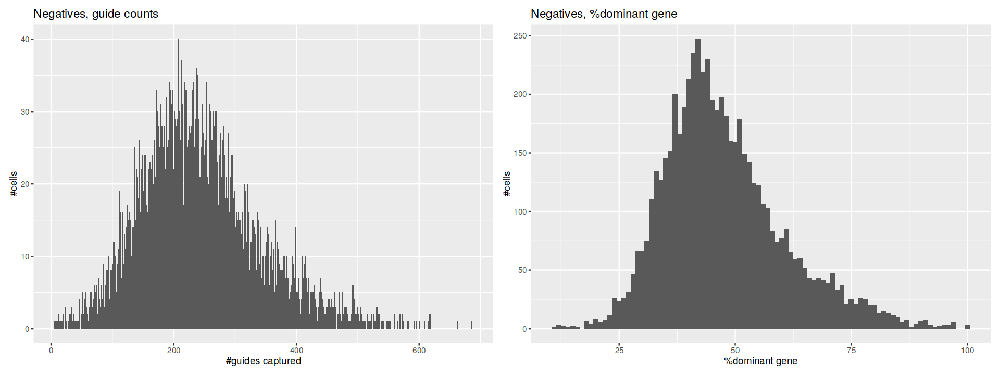

In [36]:
options(repr.plot.width = 16, repr.plot.height = 6)

plot_n_guides <- ggplot(df_negatives, aes(x = n_guides)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Negatives, guide counts", x = "#guides captured") +
    labs(y = "#cells")

plot_dominant <- ggplot(df_negatives, aes(x = percent_dominant_gene)) +
    geom_histogram(binwidth = 1) +
    labs(title = "Negatives, %dominant gene", x = "%dominant gene") +
    labs(y = "#cells")

plot_n_guides | plot_dominant

In [37]:
sample_n(df_negatives, 10)

barcode,GATA5,MEOX1,NEUROG2,NTCTL,n_guides,GATA5_1,GATA5_2,MEOX1_1,MEOX1_2,NEUROG2_1,NEUROG2_2,NTCTL_1,NTCTL_2,barcode_dash,dominant_gene_w_caveat,dominant_gene_count,percent_dominant_gene,targeted_gene_count,in_multiome
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<int>,<dbl>,<int>,<lgl>
AGGTTTATCCCTGATC,44,27,169,10,250,26,18,16,11,124,45,0,10,AGGTTTATCCCTGATC-1,NEUROG2,169,67.60000,3,TRUE
TATCCGGAGGCGCTTA,27,93,65,53,238,22,5,52,41,50,15,29,24,TATCCGGAGGCGCTTA-1,MEOX1,93,39.07563,3,TRUE
CCTTTAGTCCCTCAAC,85,153,180,1,419,58,27,111,42,95,85,0,1,CCTTTAGTCCCTCAAC-1,NEUROG2,180,42.95943,3,TRUE
TCGGTAAGTATACTGG,28,66,13,34,141,27,1,63,3,5,8,29,5,TCGGTAAGTATACTGG-1,MEOX1,66,46.80851,3,TRUE
CAACTAATCCGTTAAA,0,296,84,65,445,0,0,214,82,36,48,35,30,CAACTAATCCGTTAAA-1,MEOX1,296,66.51685,2,TRUE
TACAGCTAGTGAGCGG,116,86,101,13,316,94,22,78,8,77,24,7,6,TACAGCTAGTGAGCGG-1,GATA5,116,36.70886,3,TRUE
CGGACAACATAAGTCT,19,51,202,22,294,14,5,43,8,131,71,22,0,CGGACAACATAAGTCT-1,NEUROG2,202,68.70748,3,TRUE
AATAGAGGTTTCGCCA,14,19,85,25,143,3,11,17,2,51,34,0,25,AATAGAGGTTTCGCCA-1,NEUROG2,85,59.44056,3,TRUE
GGTGCTTCAGGCAAGC,66,98,50,4,218,52,14,85,13,10,40,4,0,GGTGCTTCAGGCAAGC-1,MEOX1,98,44.95413,3,TRUE


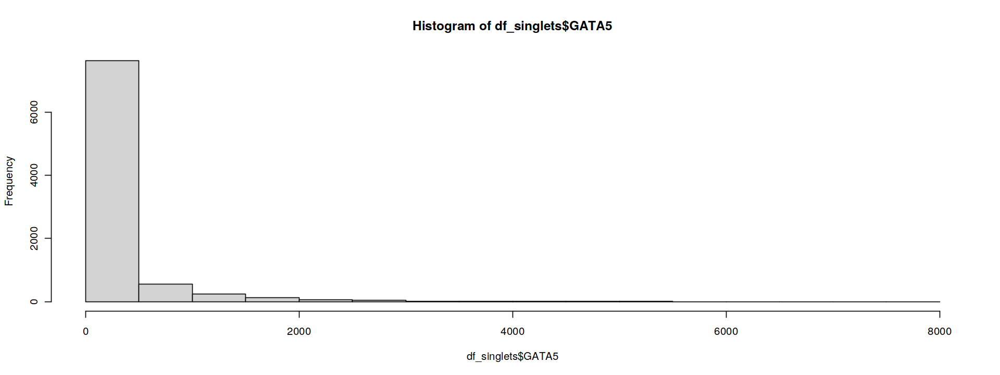

In [38]:
#hist(df_singlets$GATA5)

In [39]:
library(cluster)
library(fitdistrplus)

MaxN <- function(x, N = 2){
  len <- length(x)
  if (N > len) {
    warning('N greater than length(x).  Setting N=length(x)')
    N <- length(x)
  }
  sort(x, partial = len - N + 1)[len - N + 1]
}

myHTODemux <- function(
  object,
  assay = "HTO",
  positive.quantile = 0.99,
  init = NULL,
  nstarts = 100,
  kfunc = "clara",
  nsamples = 100,
  seed = 42,
  verbose = TRUE
) {
  if (!is.null(x = seed)) {
    set.seed(seed = seed)
  }
  #initial clustering
  assay <- assay %||% DefaultAssay(object = object)
  data <- GetAssayData(object = object, assay = assay)
  counts <- GetAssayData(
    object = object,
    assay = assay,
    slot = 'counts'
  )[, colnames(x = object)]
  counts <- as.matrix(x = counts)
  ncenters <- init %||% (nrow(x = data) + 1)
  switch(
    EXPR = kfunc,
    'kmeans' = {
      init.clusters <- kmeans(
        x = t(x = GetAssayData(object = object, assay = assay)),
        centers = ncenters,
        nstart = nstarts
      )
      #identify positive and negative signals for all HTO
      Idents(object = object, cells = names(x = init.clusters$cluster)) <- init.clusters$cluster
    },
    'clara' = {
      #use fast k-medoid clustering
      init.clusters <- clara(
        x = t(x = GetAssayData(object = object, assay = assay)),
        k = ncenters,
        samples = nsamples
      )
      #identify positive and negative signals for all HTO
      Idents(object = object, cells = names(x = init.clusters$clustering), drop = TRUE) <- init.clusters$clustering
    },
    stop("Unknown k-means function ", kfunc, ", please choose from 'kmeans' or 'clara'")
  )
  #average hto signals per cluster
  #work around so we don't average all the RNA levels which takes time
  average.expression <- AverageExpression(
    object = object,
    assays = assay,
    verbose = FALSE
  )[[assay]]
  #checking for any cluster with all zero counts for any barcode
  if (sum(average.expression == 0) > 0) {
    stop("Cells with zero counts exist as a cluster.")
  }
  #create a matrix to store classification result
  discrete <- GetAssayData(object = object, assay = assay)
  discrete[discrete > 0] <- 0
  # for each HTO, we will use the minimum cluster for fitting
  for (iter in rownames(x = data)) {
    values <- counts[iter, colnames(object)]
    #commented out if we take all but the top cluster as background
    #values_negative=values[setdiff(object@cell.names,WhichCells(object,which.max(average.expression[iter,])))]
    values.use <- values[WhichCells(
      object = object,
      idents = levels(x = Idents(object = object))[[which.min(x = average.expression[iter, ])]]
    )]
    fit <- suppressWarnings(expr = fitdist(data = values.use, distr = "nbinom"))
    cutoff <- as.numeric(x = quantile(x = fit, probs = positive.quantile)$quantiles[1])
    discrete[iter, names(x = which(x = values > cutoff))] <- 1
    if (verbose) {
      message(paste0("Cutoff for ", iter, " : ", cutoff, " reads"))
    }
  }
  # now assign cells to HTO based on discretized values
  npositive <- colSums(x = discrete)
  classification.global <- npositive
  classification.global[npositive == 0] <- "Negative"
  classification.global[npositive == 1] <- "Singlet"
  classification.global[npositive > 1] <- "Doublet"
  donor.id = rownames(x = data)
  hash.max <- apply(X = data, MARGIN = 2, FUN = max)
  hash.maxID <- apply(X = data, MARGIN = 2, FUN = which.max)
  hash.second <- apply(X = data, MARGIN = 2, FUN = MaxN, N = 2)
  hash.maxID <- as.character(x = donor.id[sapply(
    X = 1:ncol(x = data),
    FUN = function(x) {
      return(which(x = data[, x] == hash.max[x])[1])
    }
  )])
  hash.secondID <- as.character(x = donor.id[sapply(
    X = 1:ncol(x = data),
    FUN = function(x) {
      return(which(x = data[, x] == hash.second[x])[1])
    }
  )])
  hash.margin <- hash.max - hash.second
  doublet_id <- sapply(
    X = 1:length(x = hash.maxID),
    FUN = function(x) {
      return(paste(sort(x = c(hash.maxID[x], hash.secondID[x])), collapse = "_"))
    }
  )
  # doublet_names <- names(x = table(doublet_id))[-1] # Not used
  classification <- classification.global
  classification[classification.global == "Negative"] <- "Negative"
  classification[classification.global == "Singlet"] <- hash.maxID[which(x = classification.global == "Singlet")]
  classification[classification.global == "Doublet"] <- doublet_id[which(x = classification.global == "Doublet")]
  classification.metadata <- data.frame(
    hash.maxID,
    hash.secondID,
    hash.margin,
    classification,
    classification.global
  )
  colnames(x = classification.metadata) <- paste(
    assay,
    c('maxID', 'secondID', 'margin', 'classification', 'classification.global'),
    sep = '_'
  )
  object <- AddMetaData(object = object, metadata = classification.metadata)
  Idents(object) <- paste0(assay, '_classification')
  # Idents(object, cells = rownames(object@meta.data[object@meta.data$classification.global == "Doublet", ])) <- "Doublet"
  doublets <- rownames(x = object[[]])[which(object[[paste0(assay, "_classification.global")]] == "Doublet")]
  Idents(object = object, cells = doublets) <- 'Doublet'
  # object@meta.data$hash.ID <- Idents(object)
  object$hash.ID <- Idents(object = object)
  return(discrete)
}


Loading required package: MASS


Attaching package: ‘MASS’


The following object is masked from ‘package:patchwork’:

    area


The following object is masked from ‘package:dplyr’:

    select


Loading required package: survival



In [40]:
seurat_alt <- subset(seurat, cells = Cells(seurat))
disc <- myHTODemux(seurat_alt, assay = "guidecapture", positive.quantile = 0.99)

Cutoff for GATA5 : 144 reads

Cutoff for MEOX1 : 364 reads

Cutoff for NEUROG2 : 221 reads

Cutoff for NTCTL : 119 reads



# Visualize guides by clusters

## Singlets only

In [41]:
str(seurat_singlets)

Formal class 'Seurat' [package "SeuratObject"] with 13 slots
  ..@ assays      :List of 4
  .. ..$ SCT         :Formal class 'SCTAssay' [package "Seurat"] with 9 slots
  .. .. .. ..@ SCTModel.list:List of 1
  .. .. .. .. ..$ model1:Formal class 'SCTModel' [package "Seurat"] with 7 slots
  .. .. .. .. .. .. ..@ feature.attributes:'data.frame':	27294 obs. of  12 variables:
  .. .. .. .. .. .. .. ..$ detection_rate       : num [1:27294] 0.01085 0.01635 0.00179 0.00106 0.00119 ...
  .. .. .. .. .. .. .. ..$ gmean                : num [1:27294] 0.00766 0.01145 0.001239 0.000761 0.000826 ...
  .. .. .. .. .. .. .. ..$ variance             : num [1:27294] 0.01153 0.01647 0.00178 0.00126 0.00119 ...
  .. .. .. .. .. .. .. ..$ residual_mean        : num [1:27294] -5.00e-04 4.67e-05 -1.38e-03 -7.75e-03 -3.68e-03 ...
  .. .. .. .. .. .. .. ..$ residual_variance    : num [1:27294] 0.905 0.911 0.892 0.733 0.924 ...
  .. .. .. .. .. .. .. ..$ theta                : num [1:27294] 0.1429 0.188 0.0538 

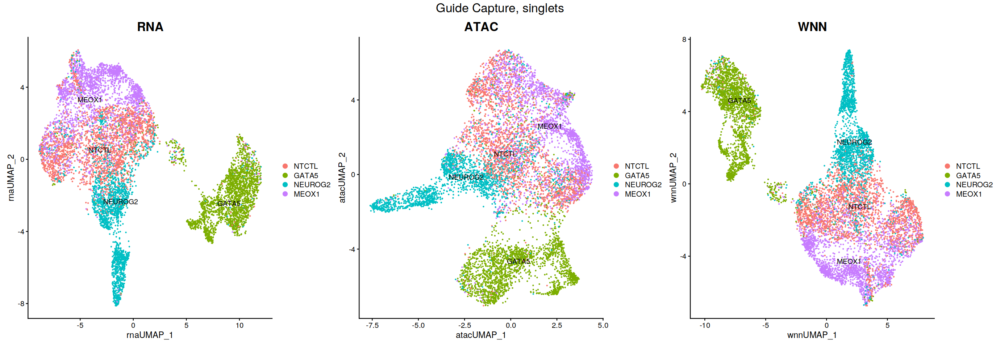

In [42]:
options(repr.plot.width = 23, repr.plot.height = 8)
Idents(seurat_singlets) <- seurat_singlets@meta.data$guidecapture_classification

p1 <- DimPlot(seurat_singlets, reduction = "umap.rna", label = TRUE, label.size = 4, repel = TRUE) + ggtitle("RNA")
p2 <- DimPlot(seurat_singlets, reduction = "umap.atac", label = TRUE, label.size = 4, repel = TRUE) + ggtitle("ATAC")
p3 <- DimPlot(seurat_singlets, reduction = "wnn.umap", label = TRUE, label.size = 4, repel = TRUE) + ggtitle("WNN")
p1 + p2 + p3 & plot_annotation(title = "Guide Capture, singlets") & 
theme(plot.title = element_text(hjust = 0.5, size = 20))

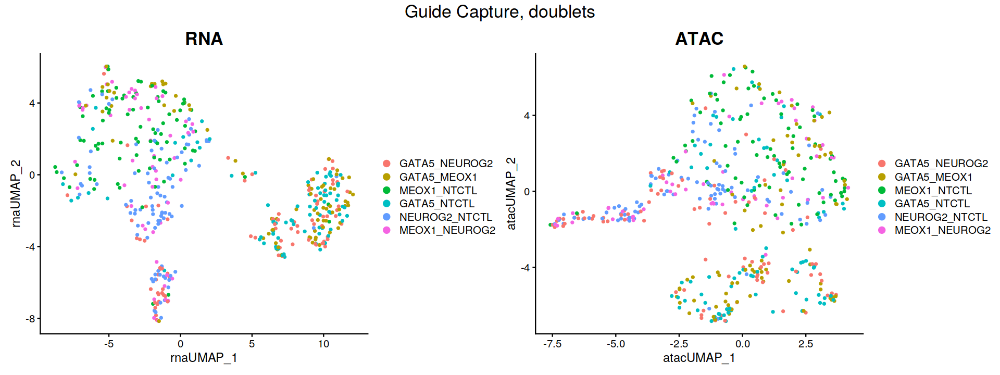

In [43]:
options(repr.plot.width = 16, repr.plot.height = 6)
p1 <- DimPlot(seurat_doublets, reduction = "umap.rna", label = FALSE, label.size = 4) + ggtitle("RNA")
p2 <- DimPlot(seurat_doublets, reduction = "umap.atac", label = FALSE, label.size = 4) + ggtitle("ATAC")
p1 + p2 & plot_annotation(title = "Guide Capture, doublets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

#p3 <- DimPlot(seurat_doublets, reduction = "wnn.umap", label = TRUE, label.size = 4, repel = TRUE) + ggtitle("WNN")

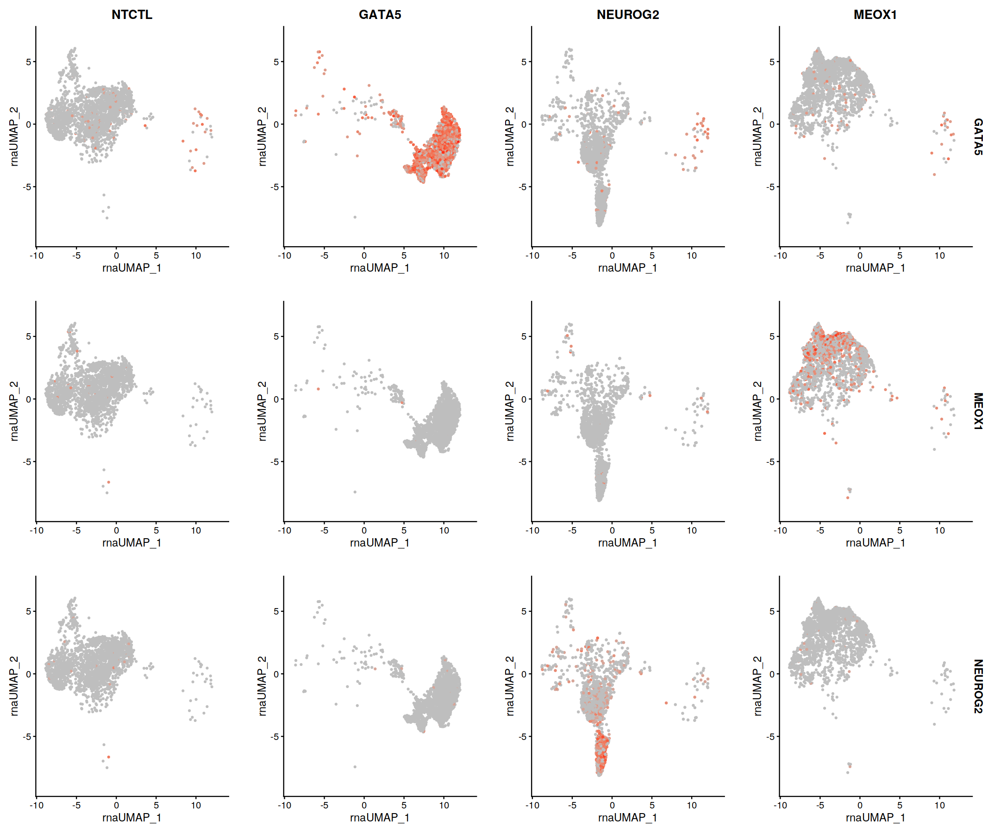

In [44]:
options(repr.plot.width = 18, repr.plot.height = 15)
tf_list <- tfs_to_plot

FeaturePlot(
    seurat_singlets,
    features = tf_list, 
    split.by = 'ident', 
    reduction = 'umap.rna', 
    cols = c("grey", "red"),
    keep.scale = "feature"
)

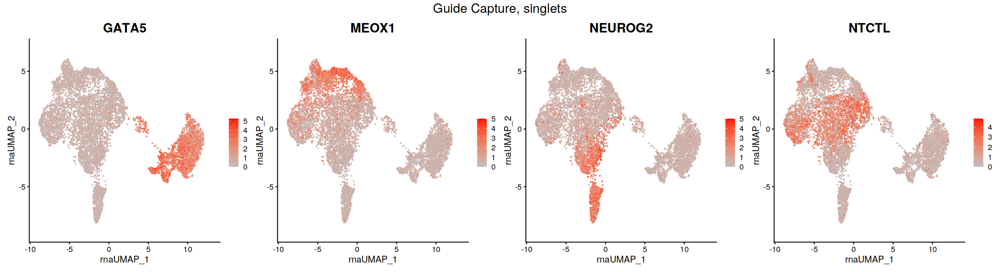

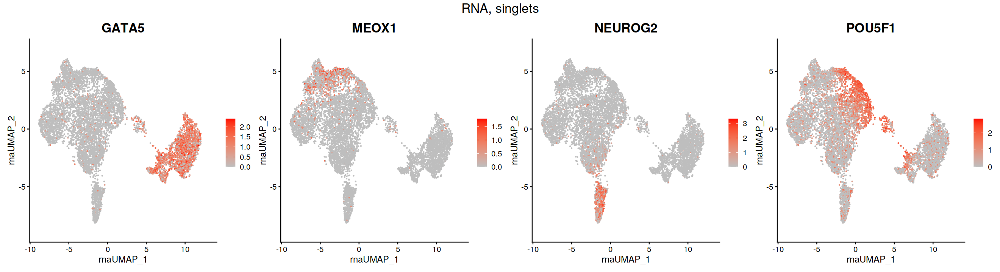

In [45]:
options(repr.plot.width = 22, repr.plot.height = 6)
guide_list <- tfs_w_ntctl
DefaultAssay(seurat_singlets) <- "guidecapture"
FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "feature",
    ncol = length(guide_list)
) +
plot_annotation(title = "Guide Capture, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

options(repr.plot.width = 22, repr.plot.height = 6)
tf_list <- c(tfs_to_plot, "POU5F1")
DefaultAssay(seurat_singlets) <- "SCT"
FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "feature",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))




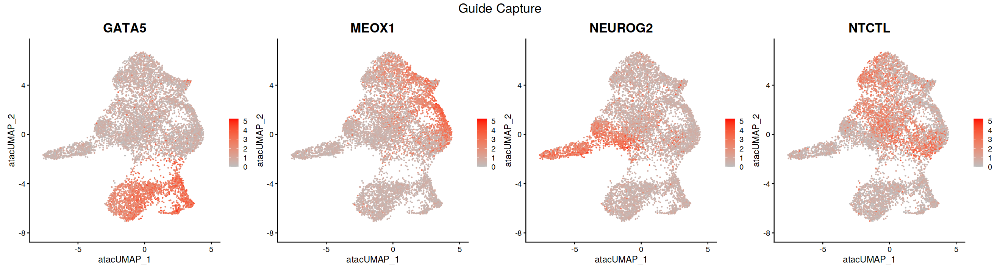

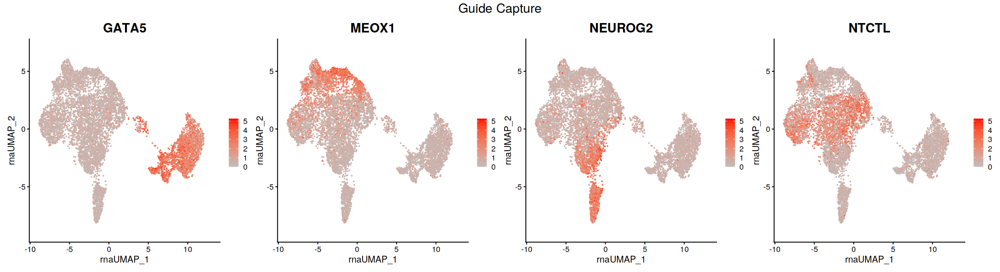

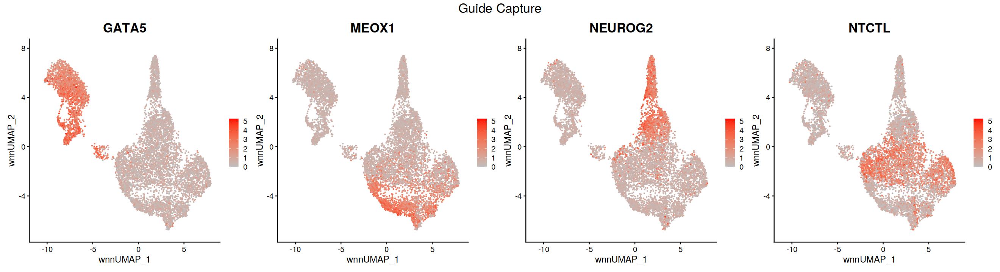

In [46]:
library(patchwork)
options(repr.plot.width = 22, repr.plot.height = 6)
tf_list <- tfs_to_plot
guide_list <- tfs_w_ntctl

DefaultAssay(seurat_singlets) <- "guidecapture"
FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'umap.atac',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features =guide_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = guide_list,
    reduction = 'wnn.umap',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(guide_list)
) +
plot_annotation(title = "Guide Capture") &
theme(plot.title = element_text(hjust = 0.5, size = 20))



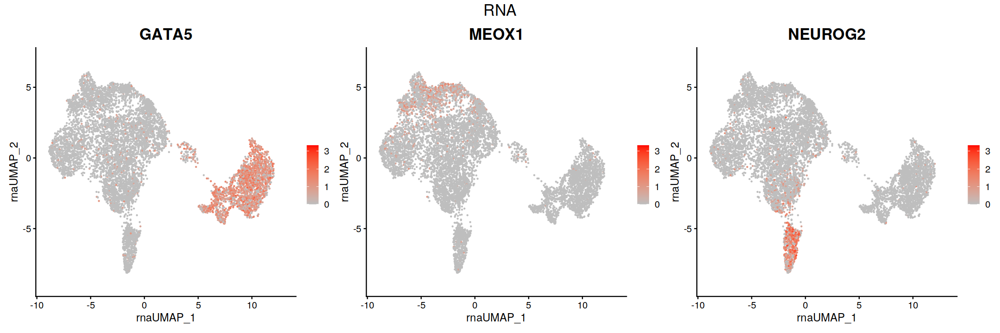

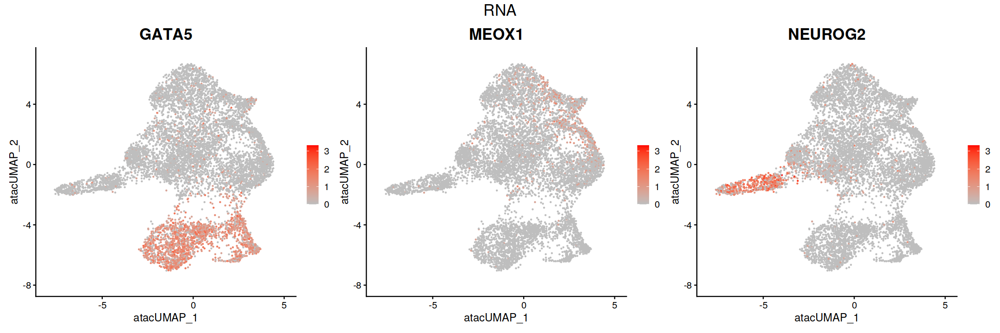

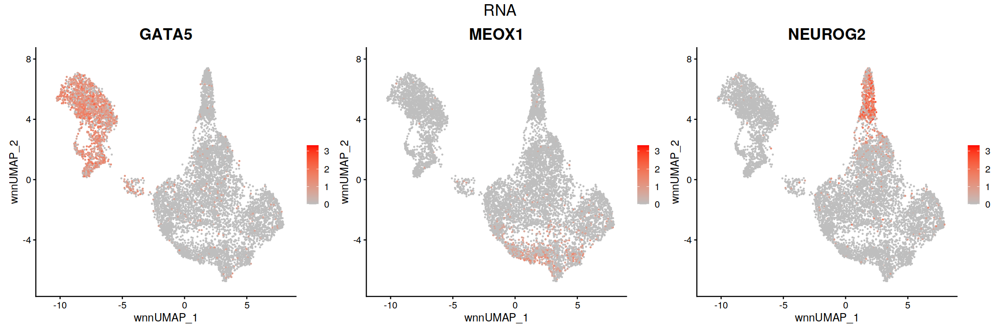

In [47]:

options(repr.plot.width = 18, repr.plot.height = 6)
tf_list <- tfs_to_plot
DefaultAssay(seurat_singlets) <- "SCT"

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.rna',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'umap.atac',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

FeaturePlot(
    seurat_singlets,
    features = tf_list,
    reduction = 'wnn.umap',
    cols = c("grey", "red"),
    keep.scale = "all",
    ncol = length(tf_list)
) +
plot_annotation(title = "RNA") &
theme(plot.title = element_text(hjust = 0.5, size = 20))

## Doublets only

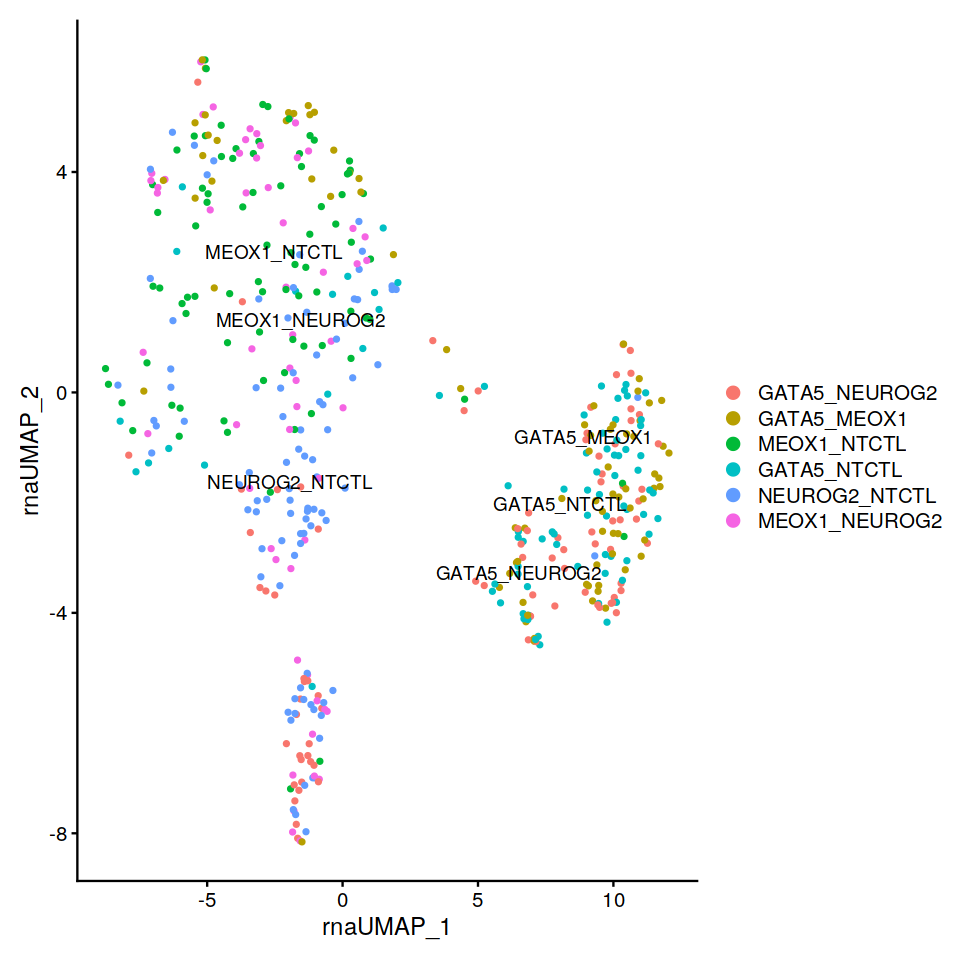

In [48]:
options(repr.plot.width = 8, repr.plot.height = 8)

Idents(seurat_doublets) <- seurat_doublets@meta.data$guidecapture_classification

plot <- DimPlot(
    seurat_doublets,
    reduction = "umap.rna"
)
LabelClusters(
    plot = plot,
    id = "ident"
)

Warning message in FeaturePlot(seurat_doublets, features = tf_list, split.by = "ident", :
“All cells have the same value (0) of MEOX1.”
Warning message in FeaturePlot(seurat_doublets, features = tf_list, split.by = "ident", :
“All cells have the same value (0) of NEUROG2.”
Warning message in FeaturePlot(seurat_doublets, features = tf_list, split.by = "ident", :
“All cells have the same value (0) of MEOX1.”


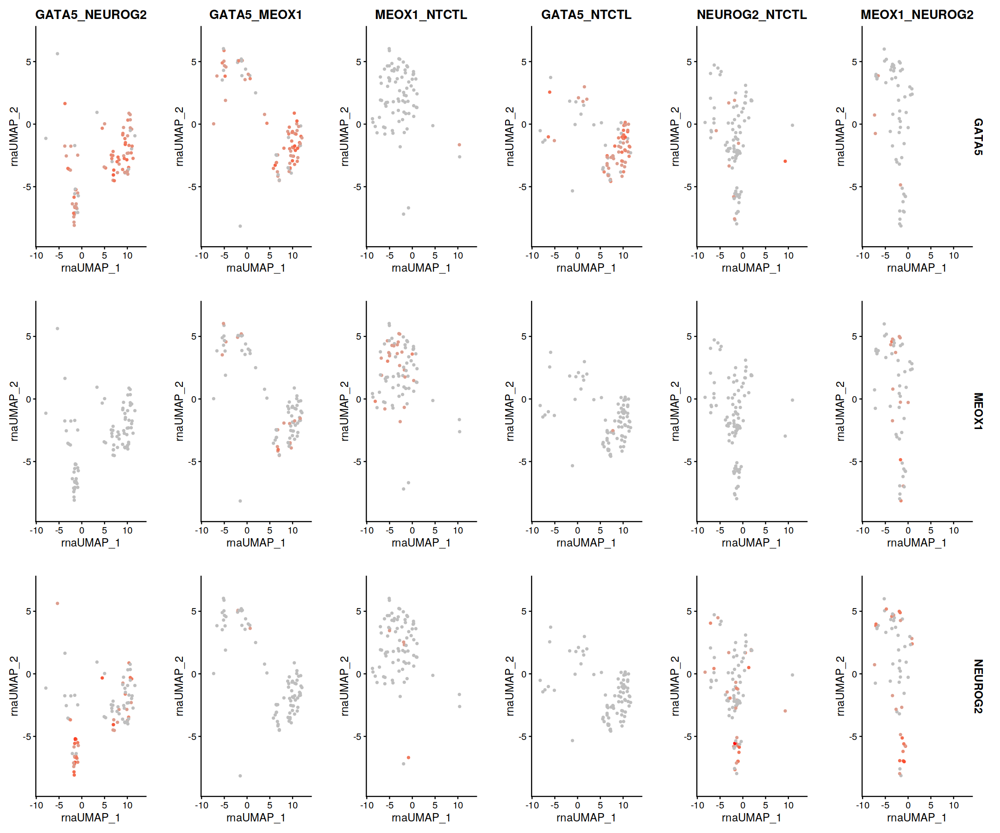

In [49]:
options(repr.plot.width = 18, repr.plot.height = 15)
tf_list <- tfs_to_plot
DefaultAssay(seurat_singlets) <- "SCT"

FeaturePlot(
    seurat_doublets,
    features = tf_list, 
    split.by = 'ident', 
    reduction = 'umap.rna', 
    cols = c("grey", "red"),
    keep.scale = "all"
)

# Get cell counts in clusters

In [50]:
Assays(seurat_singlets)

[1] "SCT"          "ATAC"         "RNA"          "guidecapture"

In [51]:

DefaultAssay(seurat_singlets) <- "RNA"
seurat_singlets@meta.data$seurat_clusters
seurat_singlets <- StashIdent(seurat_singlets, save.name = "current.ident")

[1] 0  9  2  12 4  5  4  7  0  2  2  4  6  4  1  2  5  9  2  5  5  3  2  11
  [25] 5  8  4  1  1  4  1  6  1  6  9  7  0  8  2  6  7  4  9  1  12 2  0  1 
  [49] 2  4  0  7  11 4  1  6  5  1  4  13 8  7  8  3  5  4  12 7  13 13 4  10
  [73] 0  3  1  2  5  9  11 0  1  6  4  1  5  12 0  1  0  14 7  2  6  6  5  11
  [97] 2  5  13 1  8  5  4  9  1  9  3  1  2  1  8  4  1  4  7  13 6  7  2  1 
 [121] 13 1  4  1  2  7  12 0  11 2  8  0  0  7  1  0  1  5  8  9  2  6  2  4 
 [145] 4  5  12 13 0  2  8  1  2  5  4  11 4  5  11 12 7  0  12 11 8  4  0  2 
 [169] 8  0  3  11 1  3  11 9  12 1  5  12 4  1  0  6  4  7  2  8  6  1  7  2 
 [193] 11 3  8  6  6  6  1  9  2  2  6  11 1  11 14 2  5  4  11 0  2  12 5  5 
 [217] 5  7  11 2  8  8  1  2  5  9  11 7  0  3  0  0  4  1  0  12 4  4  11 1 
 [241] 6  8  3  2  2  1  1  2  1  0  8  2  11 2  12 13 5  8  3  7  8  8  6  3 
 [265] 8  4  4  3  1  9  1  8  0  1  4  0  2  2  1  2  4  9  5  3  9  1  4  5 
 [289] 14 1  9  5  1  11 8  7  4  2  7  0  1  8  4  1  4  10 5  9  2  9  1  6 
 [313] 9  5  2  2  12 0  5  1  5  11 5  4  12 0  7  12 0  1  5  9  1  3  2  0 
 [337] 2  4  4  12 5  0  4  2  4  0  12 3  3  0  4  0  2  4  1  8  8  11 3  2 
 [361] 8  0  4  7  5  2  2  1  8  2  5  4  9  4  1  1  12 5  5  8  3  1  7  5 
 [385] 9  7  0  7  6  1  5  7  2  3  0  1  1  2  9  6  3  4  3  12 0  2  10 2 
 [409] 3  3  3  2  4  2  8  5  13 1  4  11 1  2  1  5  3  1  2  2  3  11 11 4 
 [433] 1  8  5  1  5  7  5  6  1  9  3  4  2  6  2  2  1  4  11 9  3  4  2  5 
 [457] 0  13 5  4  9  12 5  2  9  0  2  2  6  3  3  5  13 1  9  14 5  12 1  8 
 [481] 4  0  6  0  2  12 11 2  4  2  13 0  13 0  4  1  6  2  4  0  6  7  4  9 
 [505] 1  8  1  2  2  2  5  4  9  4  5  10 8  0  1  0  12 0  0  4  1  1  8  2 
 [529] 5  2  6  4  1  10 5  5  9  4  8  1  3  4  4  0  2  0  11 2  4  5  12 13
 [553] 3  8  4  2  7  2  9  0  3  1  7  8  0  4  3  13 8  1  10 4  11 4  8  12
 [577] 1  2  5  4  1  14 11 11 2  4  6  14 5  9  4  3  10 1  3  6  12 8  2  6 
 [601] 2  11 0  5  7  1  6  7  5  6  5  0  1  0  8  4  5  2  11 12 1  6  4  4 
 [625] 4  1  11 8  4  14 0  14 9  0  6  5  4  2  11 0  1  2  4  11 1  14 3  4 
 [649] 4  2  2  2  1  4  13 1  8  0  0  6  9  1  4  6  3  1  2  11 1  4  3  0 
 [673] 2  14 4  4  0  14 9  0  2  14 5  6  0  1  4  0  5  8  13 6  0  5  5  0 
 [697] 8  5  1  1  0  12 12 4  0  11 4  9  2  9  8  5  4  4  11 11 11 2  5  9 
 [721] 12 1  0  0  8  2  8  2  9  13 4  4  1  9  1  0  3  12 8  2  5  5  3  11
 [745] 3  5  4  0  2  5  4  4  1  12 2  2  12 9  5  5  14 11 8  12 9  5  12 4 
 [769] 0  10 5  11 11 0  8  14 2  1  7  0  6  0  3  12 0  2  5  5  5  8  5  14
 [793] 5  6  12 3  1  0  6  4  8  12 6  2  2  7  5  8  1  8  7  11 8  14 13 11
 [817] 12 7  6  8  0  0  5  0  4  3  8  1  11 0  4  2  4  1  5  2  1  3  1  1 
 [841] 1  8  8  2  6  9  5  2  8  0  2  5  0  6  2  0  8  5  3  1  7  3  4  0 
 [865] 0  5  1  12 4  2  13 2  4  6  5  7  13 0  5  2  0  11 8  2  4  1  4  9 
 [889] 1  9  3  1  4  1  2  3  1  3  3  11 0  1  1  2  4  1  9  9  2  0  3  9 
 [913] 4  13 5  1  1  14 12 5  5  3  1  2  1  1  11 9  6  11 3  2  4  12 3  6 
 [937] 2  2  1  11 2  4  0  8  2  2  6  2  1  8  6  6  2  11 5  5  2  1  1  2 
 [961] 1  2  5  3  7  1  3  1  0  14 4  1  0  2  1  4  1  2  11 11 1  11 14 2 
 [985] 1  0  4  2  1  8  6  0  2  4  9  8  12 5  4  5  6  0  5  5  1  0  5  12
[1009] 2  4  9  4  1  12 0  4  1  11 1  13 8  8  0  5  1  1  2  5  2  2  1  14
[1033] 3  2  2  6  4  3  2  4  1  7  11 1  11 2  5  6  4  5  6  9  11 14 2  5 
[1057] 4  6  1  0  2  1  4  6  7  7  11 5  4  4  5  6  1  0  9  4  9  2  7  1 
[1081] 12 0  6  11 0  12 0  1  4  6  9  7  2  2  1  5  8  11 12 0  2  3  1  5 
[1105] 3  9  5  4  11 8  1  1  2  12 1  6  1  5  5  4  8  2  0  6  11 14 1  8 
[1129] 8  13 2  1  9  2  4  0  5  8  1  0  11 1  0  4  12 12 9  8  5  10 12 7 
[1153] 6  4  2  3  10 13 9  2  3  6  5  0  0  1  9  0  6  2  1  1  4  12 1  5 
[1177] 2  1  0  3  3  12 1  4  2  0  5  4  7  0  2  6  11 2  3  1  2  1  2  0 
[1201] 6  2  2  5  0  0  0  0  5  5  9  0  3  1  0  7

With Seurat 3.X, stashing identity classes can be accomplished with the following:
seurat_singlets[["current.ident"]] <- Idents(object = seurat_singlets)



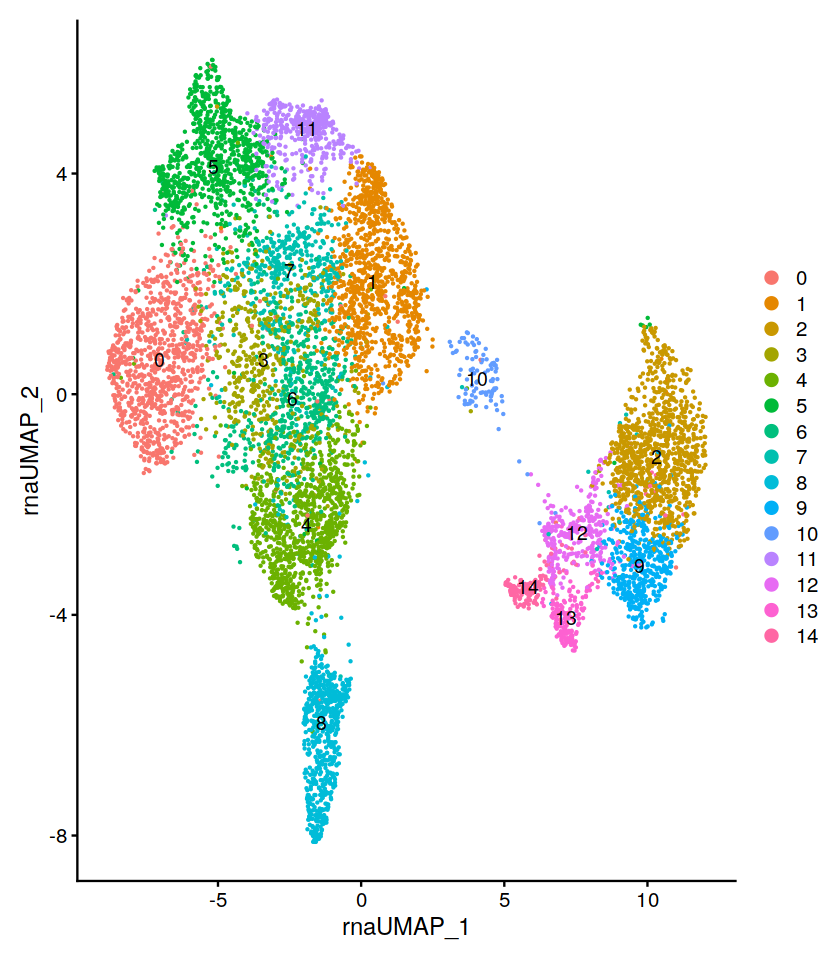

In [52]:
options(repr.plot.width = 7, repr.plot.height = 8)
seurat_singlets <- SetIdent(seurat_singlets, value = seurat_singlets@meta.data$seurat_clusters)
DimPlot(seurat_singlets, reduction = 'umap.rna', label = TRUE)

In [53]:
cluster_counts <- table(Idents(seurat_singlets))
as.data.frame(cluster_counts)


Var1,Freq
<fct>,<int>
0,952
1,1031
2,1027
3,491
4,983
5,887
6,594
7,444
8,650


In [54]:
#cluster_counts[['2']] + cluster_counts[['5']] + cluster_counts[['11']] + cluster_counts[['13']] + cluster_counts[['14']]

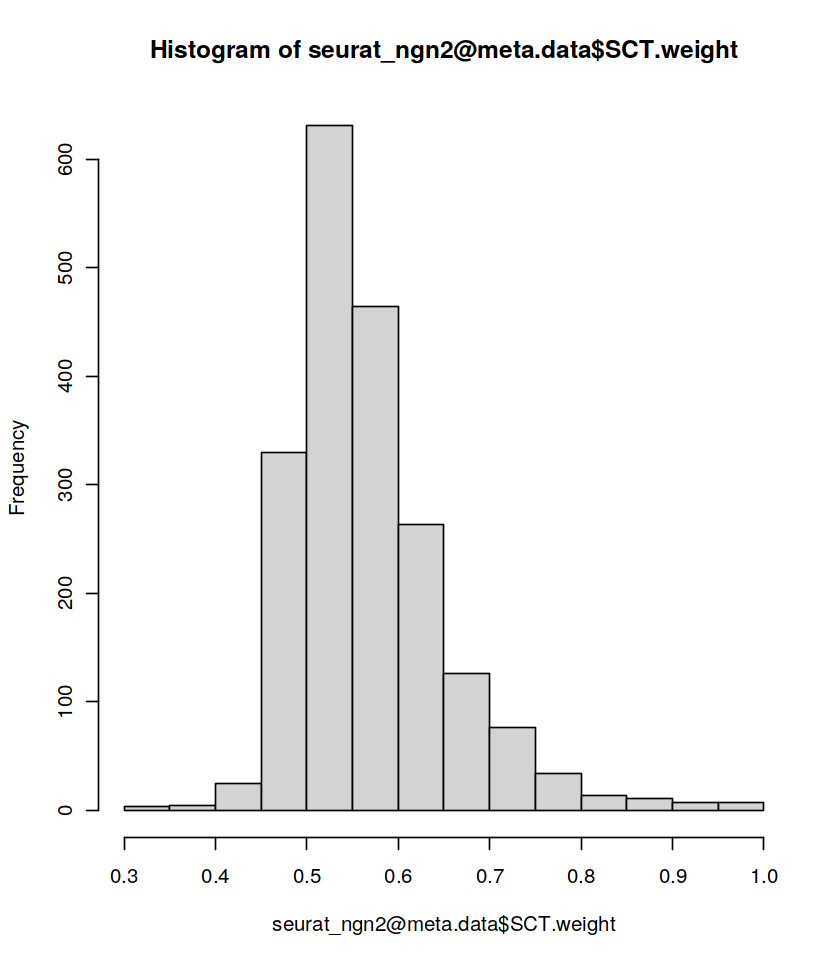

In [55]:
DefaultAssay(seurat_singlets) <- "guidecapture"
Idents(seurat_singlets) <- "guidecapture_classification"

In [ ]:
seurat_ngn2 <- subset(seurat_singlets, idents = tfs_w_ntctl[1])
hist(seurat_ngn2@meta.data$SCT.weight)

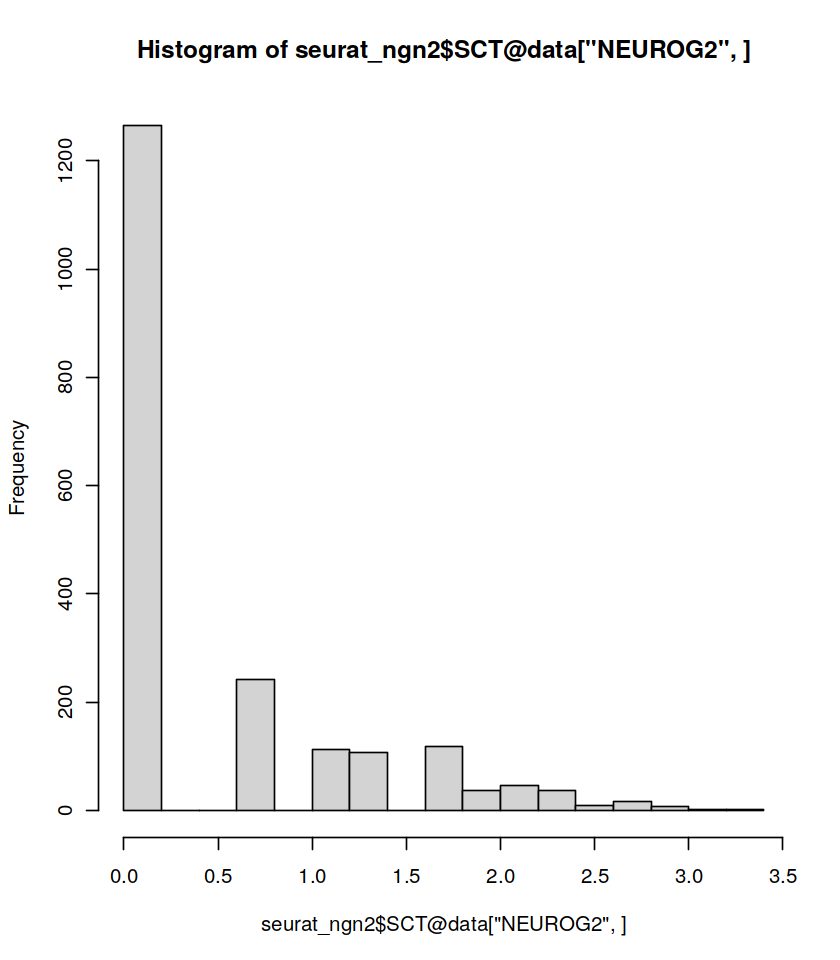

In [56]:
hist(seurat_ngn2$SCT@data[tfs_w_ntctl[1],])

Picking joint bandwidth of 0.0788

Picking joint bandwidth of 0.0608

Picking joint bandwidth of 0.0701

Picking joint bandwidth of 0.0796

Picking joint bandwidth of 0.0255

Picking joint bandwidth of 0.0193

Picking joint bandwidth of 0.0249

Picking joint bandwidth of 0.11



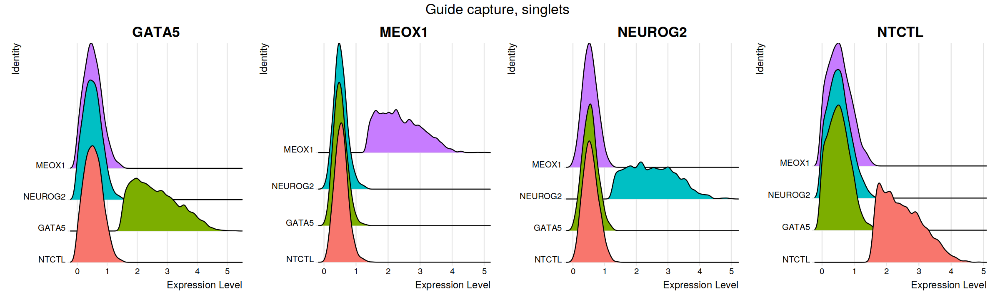

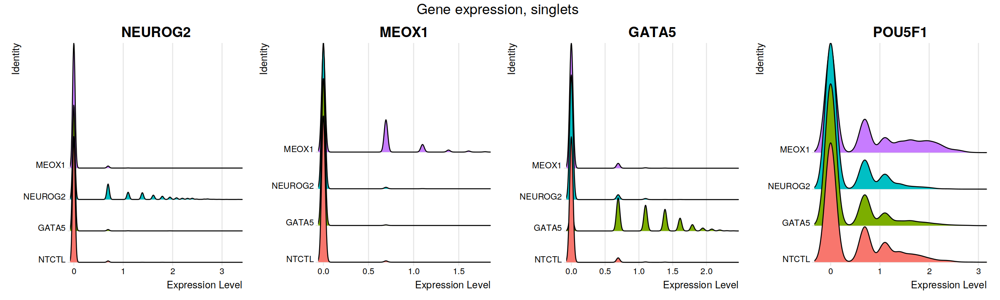

In [57]:
Idents(seurat_singlets) <- "guidecapture_classification"
options(repr.plot.width = 20, repr.plot.height = 6)
tf_list <- tfs_to_plot

Idents(seurat) <- "guidecapture_classification"
RidgePlot(
    seurat_singlets,
    assay = "guidecapture",
    features = guide_names,
    ncol = 4
) +
plot_annotation(title = "Guide capture, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))


RidgePlot(
    seurat_singlets,
    assay = "SCT",
    features = tf_list,
    ncol = 4,
) +
plot_annotation(title = "Gene expression, singlets") &
theme(plot.title = element_text(hjust = 0.5, size = 20))


Picking joint bandwidth of 0.102



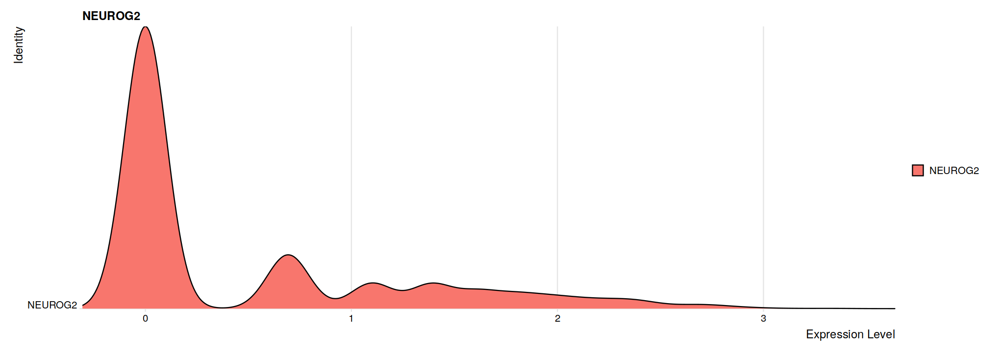

In [58]:
# seurat_ngn2 <- subset(seurat_singlets, idents = "NEUROG2")

# options(repr.plot.width = 17, repr.plot.height = 6)
# RidgePlot(
#     seurat_singlets,
#     assay = "SCT",
#     features = "NEUROG2",
#     idents = "NEUROG2",
#     y.max = .5
# )

# How many singlets express both Protospacer1 and 2?

In [59]:
singlet_barcodes <- Cells(seurat_singlets)

In [60]:
select_singlets <- df_guide$barcode_dash %in% singlet_barcodes
df_singlets     <- df_guide[select_singlets,]

In [61]:
singlets_metadata <- seurat_singlets@meta.data['guidecapture_classification']
singlets_metadata['barcode_dash'] <- rownames(singlets_metadata)
head(singlets_metadata)

,guidecapture_classification,barcode_dash
,<chr>,<chr>
AAACAGCCACATTGCA-1,NTCTL,AAACAGCCACATTGCA-1
AAACAGCCACCAAAGG-1,GATA5,AAACAGCCACCAAAGG-1
AAACAGCCAGGTTATT-1,GATA5,AAACAGCCAGGTTATT-1
AAACAGCCAGTATGTT-1,GATA5,AAACAGCCAGTATGTT-1
AAACAGCCATAATCCG-1,NEUROG2,AAACAGCCATAATCCG-1
AAACAGCCATGTGGGA-1,MEOX1,AAACAGCCATGTGGGA-1


In [62]:
df_singlets <- merge(df_singlets, singlets_metadata, by = "barcode_dash")

In [63]:
head(df_singlets)

,barcode_dash,barcode,GATA5,MEOX1,NEUROG2,NTCTL,n_guides,GATA5_1,GATA5_2,MEOX1_1,⋯,NEUROG2_1,NEUROG2_2,NTCTL_1,NTCTL_2,dominant_gene_w_caveat,dominant_gene_count,percent_dominant_gene,targeted_gene_count,in_multiome,guidecapture_classification
,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<chr>,<int>,<dbl>,<int>,<lgl>,<chr>
1,AAACAGCCACATTGCA-1,AAACAGCCACATTGCA,57,75,82,171,385,33,24,65,⋯,42,40,92,79,NEUROG2,82,21.29870,3,TRUE,NTCTL
2,AAACAGCCACCAAAGG-1,AAACAGCCACCAAAGG,1266,20,12,17,1315,825,441,20,⋯,10,2,15,2,GATA5,1266,96.27376,3,TRUE,GATA5
3,AAACAGCCAGGTTATT-1,AAACAGCCAGGTTATT,230,104,84,22,440,122,108,85,⋯,65,19,0,22,GATA5,230,52.27273,3,TRUE,GATA5
4,AAACAGCCAGTATGTT-1,AAACAGCCAGTATGTT,1409,81,45,10,1545,670,739,58,⋯,0,45,5,5,GATA5,1409,91.19741,3,TRUE,GATA5
5,AAACAGCCATAATCCG-1,AAACAGCCATAATCCG,10,97,874,28,1009,10,0,77,⋯,170,704,0,28,NEUROG2,874,86.62042,3,TRUE,NEUROG2
6,AAACAGCCATGTGGGA-1,AAACAGCCATGTGGGA,11,746,108,1,866,11,0,632,⋯,25,83,1,0,MEOX1,746,86.14319,3,TRUE,MEOX1


In [64]:
# # Count the singlets where both PSs are captured

# fracs_list <- list()
# guide_list <- c("NEUROG2", "MEOX1", "GATA5", "NTCTL")
# ps_list <- list(
#             'NEUROG2_pss' = c("NEUROG2_1", "NEUROG2_2"),
#             'MEOX1_pss' = c("MEOX1_1", "MEOX1_2"),
#             'GATA5_pss' = c("GATA5_1", "GATA5_2"),
#             'NTCTL_pss' = c("NTCTL_1", "NTCTL_2")
#         )

# for(guide in guide_list) {
#     ps_col_names <- c(paste0(guide, "_1"), paste0(guide, "_2"))
#     select_guide <- df_singlets$guidecapture_classification == guide
    
#     for(ps_pair in names(ps_list)){ 
#         ps_col_names <- ps_list[[ps_pair]]
#         df_dummy <- df_singlets[select_guide, ps_col_names]    
#         both_ps_captured <- (df_dummy[,1] > 0) & (df_dummy[,2] > 0)
#         frac_dual_ps <- round(sum(both_ps_captured)/nrow(df_dummy),2)
#         #print(paste(guide, ps_pair, frac_dual_ps))
#         fracs_list <- rbind(fracs_list, list(guide, ps_pair, frac_dual_ps))
#     }

    
# }

In [65]:
# For singlets
# V1 is assigned barcode
# V2 is the name of the gene/guide where both protospacers are detected in barcode
# V3 is the fraction of barcodes with the both protospacers of gene/guide in V2 

# as.data.frame(fracs_list)

V1,V2,V3
<list>,<list>,<list>
NEUROG2,NEUROG2_pss,1
NEUROG2,MEOX1_pss,0.88
NEUROG2,GATA5_pss,0.74
NEUROG2,NTCTL_pss,0.59
MEOX1,NEUROG2_pss,0.93
MEOX1,MEOX1_pss,0.99
MEOX1,GATA5_pss,0.75
MEOX1,NTCTL_pss,0.61
GATA5,NEUROG2_pss,0.93
